<a href="https://colab.research.google.com/github/Deleon57/EDAB6808/blob/main/EDAB_ASMT_5_2025.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**EDAB6808 Assignment 5: Anomaly Detection Notebook**


#####**B.Com Hons Business and Financial Analytics (Hons), University of the Free State**  

#####**Due Date: 10 November 2025**

---

####**Instructions Outline:**

*They say A picture speaks A 1000 words, well, in this notebook, we have a 100 of them (see the annomaly detection images at the end)*

Your mark for the evaluation is your final evaluation % minust 85, then factored to 100 from 15. On other words:
if you recieved 92% final accuracy, then it is:
- 92 - 85 = 7
- 7 / 15 * 100 = 46% (for the assignment)

You are only allowed to edit the 1 cell within the model.

Your model will get new data for the evaluation.

The code below downloads the data.

**You are not allowed to edit this**

In [ ]:
import gdown
import os

# The ID from your Google Drive URL
file_id = '1-ZgKZSvoP8SVGJwdESr8a-Zp0nPFAJ9Y'
output_zip = 'EDAB6808_Data.zip'

# Download the file using its ID
gdown.download(id=file_id, output=output_zip, quiet=False)

# Unzip the file to the current directory
!unzip -q -o {output_zip}

# Clean up the zip file (optional)
os.remove(output_zip)

print("File downloaded and extracted to the current directory.")

Downloading...
From: https://drive.google.com/uc?id=1-ZgKZSvoP8SVGJwdESr8a-Zp0nPFAJ9Y
To: /content/EDAB6808_Data.zip
100%|██████████| 18.3M/18.3M [00:00<00:00, 64.2MB/s]


File downloaded and extracted to the current directory.


 # This gives the shape of the train data and the file
**You are not allowed to edit this**

In [ ]:
import pandas as pd
import os
import random
import numpy as np
import matplotlib.pyplot as plt

train_file_names = os.listdir("train/")
train_file_names.sort()

train_files = []
for file in train_file_names:
    train_files.append(pd.read_csv(f"train/{file}", sep=";"))

test_file_names = os.listdir("test/")
test_file_names.sort()

test_files = []
for file in test_file_names:
    test_files.append(pd.read_csv(f"test/{file}", sep=";"))

test_files[0].head()

,Value1,Labels
0,0.591902,0.0
1,0.597335,0.0
2,0.602158,0.0
3,0.606395,0.0
4,0.610058,0.0


In [ ]:
pip install numba

# **The Model**

**This is the only code you can edit**
**You are allowed to add more libraries**

In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.svm import OneClassSVM
from sklearn.neighbors import LocalOutlierFactor
from sklearn.covariance import EllipticEnvelope
from sklearn.preprocessing import StandardScaler
from numba import njit
import numpy as np

@njit
def create_windows_numba(series, window_size):
    n_windows = len(series) - window_size + 1
    windows = np.empty((n_windows, window_size), dtype=np.float32)
    for i in range(n_windows):
        windows[i, :] = series[i:i+window_size]
    return windows

@njit
def normalize_scores(scores):
    min_s = np.min(scores)
    max_s = np.max(scores)
    return (scores - min_s) / (max_s - min_s + 1e-8)

class AnomalyDetectionModel:
    def __init__(self, window_size=30):
        self.window_size = window_size
        self.offset = window_size // 2
        self.scaler = StandardScaler()
        self.models = {
            'IsolationForest': IsolationForest(contamination=0.01, random_state=42),
            'OneClassSVM': OneClassSVM(kernel='rbf', gamma='scale', nu=0.01),
            'EllipticEnvelope': EllipticEnvelope(contamination=0.01, support_fraction=0.75, random_state=42),
        }
        self.use_lof = True
        self.lof_model = LocalOutlierFactor(n_neighbors=20, contamination=0.01, novelty=True)

    def fit(self, X: np.ndarray, y: np.ndarray = None):
        self.train_windows = self._create_windows(X)
        self.scaled_train_windows = self.scaler.fit_transform(self.train_windows)

        for name, model in self.models.items():
            model.fit(self.scaled_train_windows)
        if self.use_lof:
            self.lof_model.fit(self.scaled_train_windows)

    def predict(self, X: np.ndarray):
        test_windows = self._create_windows(X)
        scaled_test_windows = self.scaler.transform(test_windows)

        all_scores = []

        for name, model in self.models.items():
            if hasattr(model, "decision_function"):
                scores = model.decision_function(scaled_test_windows)
                scores = normalize_scores(scores)
                all_scores.append(scores)
            else:
                preds = model.predict(scaled_test_windows)
                scores = np.where(preds == -1, 0, 1)
                all_scores.append(scores)

        if self.use_lof:
            lof_scores = self.lof_model.decision_function(scaled_test_windows)
            lof_scores = normalize_scores(lof_scores)
            all_scores.append(lof_scores)

        avg_scores = np.mean(all_scores, axis=0)
        most_anomalous = np.argmin(avg_scores)
        return most_anomalous + self.offset

    def _create_windows(self, series: np.ndarray):
        return create_windows_numba(series, self.window_size)

# **Evaluation - Baseline 85%**
**You are not allowed to edit this**

In [ ]:
correct = 0
for train, test in zip(train_files, test_files):
    model = AnomalyDetectionModel()

    model.fit(train.Value1.to_numpy().flatten(), train.Labels.to_numpy().flatten())

    prediction_index = model.predict(test.Value1.to_numpy().flatten())


    if (test.loc[prediction_index, "Labels"] == 1):
        correct += 1

print(f"Total score: {correct}%")

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-640.287832026452861 > -640.356593452969378). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-640.552152773430407 > -640.579042963638244). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-640.612048539153193 > -640.620518169306820). You may want to try with a higher value of support_fraction 

Total score: 95%


# You can put your rough experiements in the cells below.

You are allowed to visualise etc. to improve on the model.

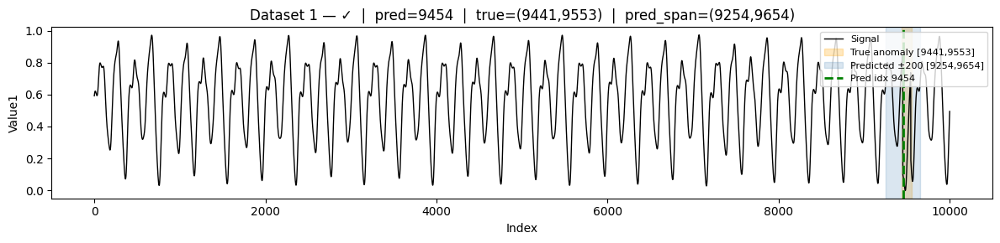

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-397.363695258081009 > -397.368112697237393). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-396.584493467169068 > -396.600661742611067). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-395.795490754755406 > -395.804569927110720). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

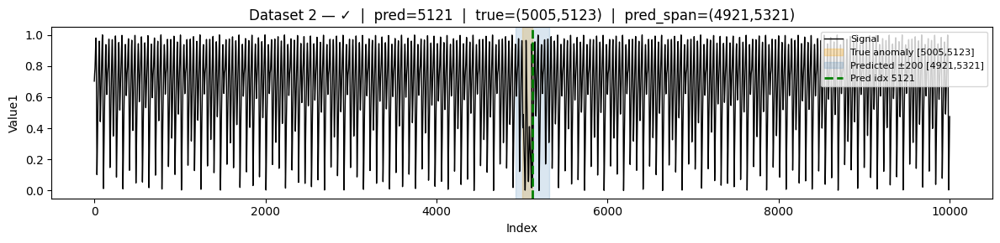

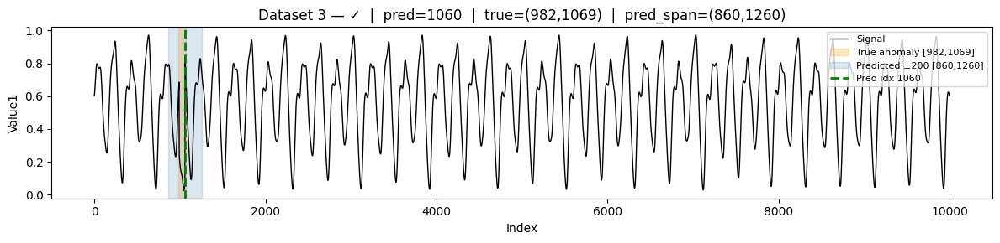

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-945.387494595411908 > -948.355927490222143). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-946.619686054274894 > -949.070975420616378). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-946.308932842333206 > -947.408441658651100). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local

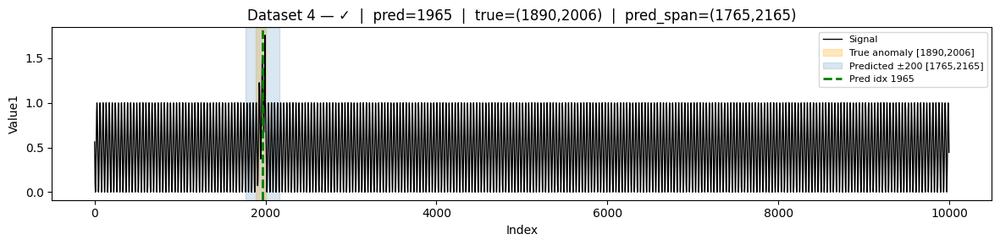

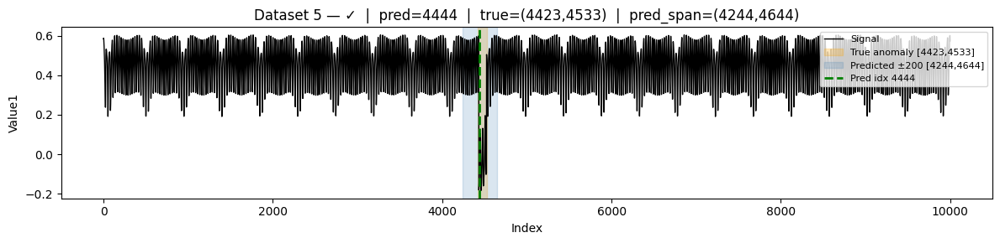

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-588.096183685000142 > -588.130235565057546). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-589.429664168210024 > -589.606817290695744). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-589.391595270277321 > -589.411146913002312). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local

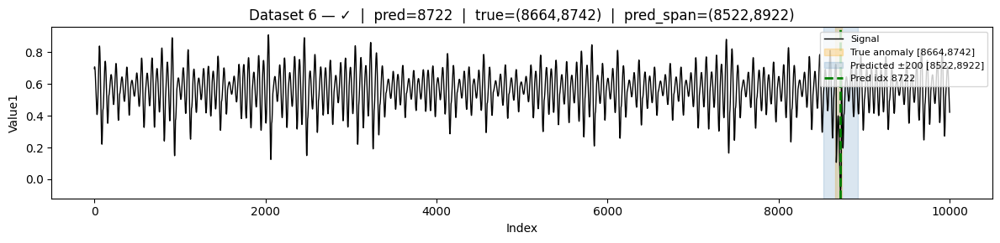

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-601.168895759152861 > -601.264054924251923). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-625.523873670144894 > -625.669299867347831). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-596.997648467352292 > -597.055609240290664). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local

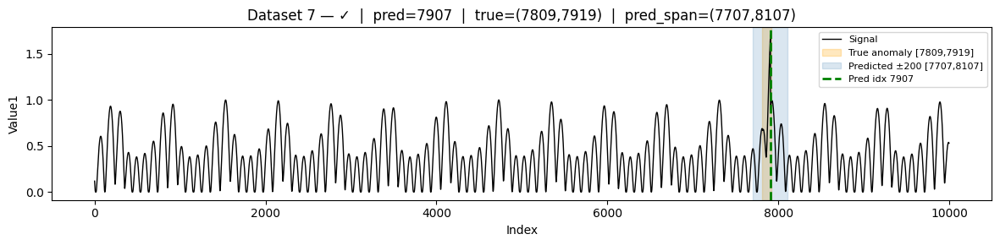

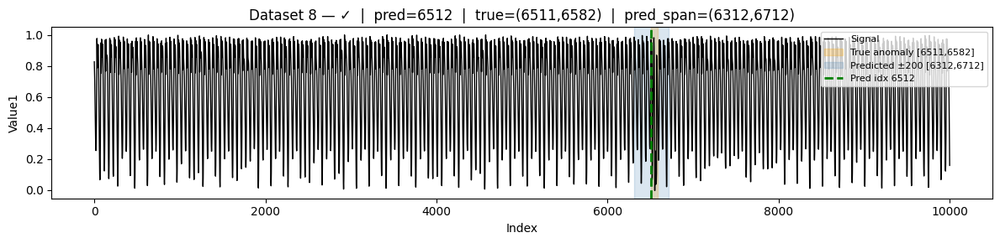

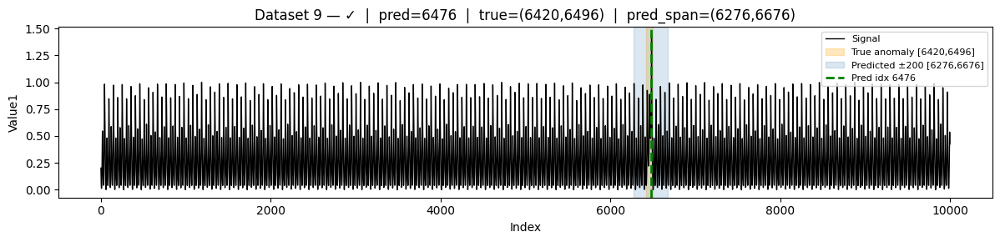

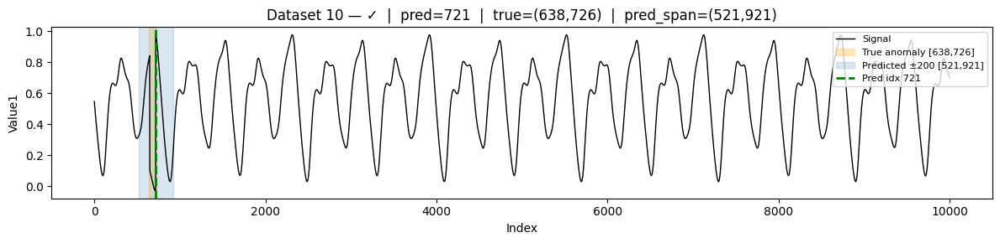

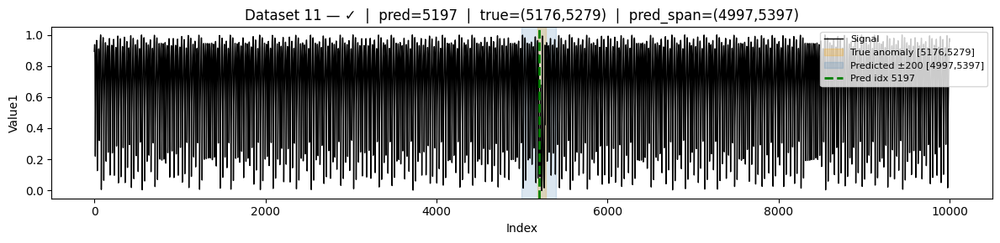

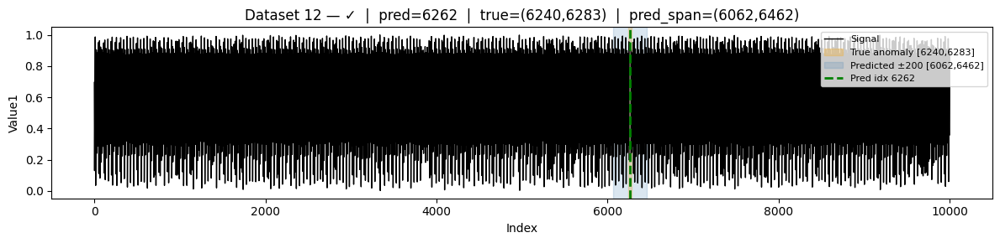

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-945.266405137563652 > -951.666514153147091). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-945.416410428272229 > -946.530598798775713). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-943.961945846312915 > -946.441695078631597). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local

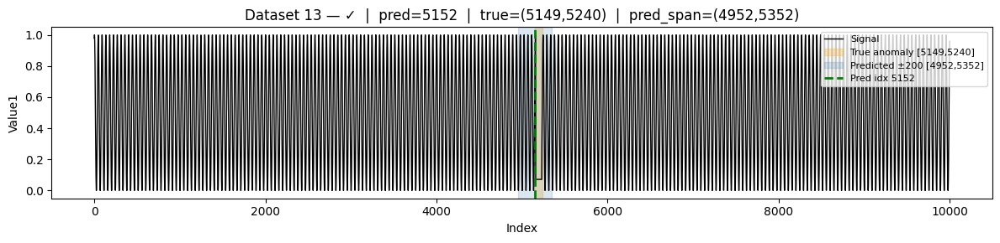

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-654.649682652491265 > -654.852881005322956). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-654.427346023977407 > -654.437836422852456). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-654.898881020174258 > -654.975376089958218). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

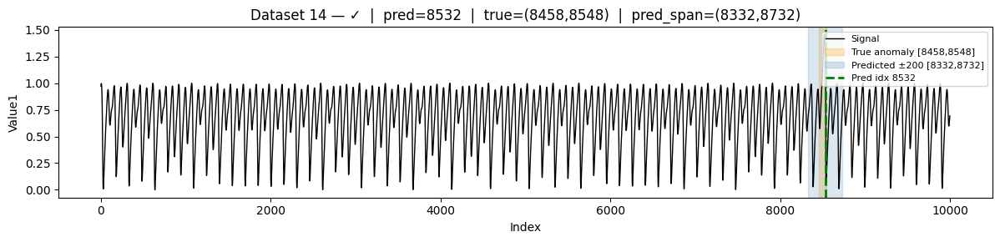

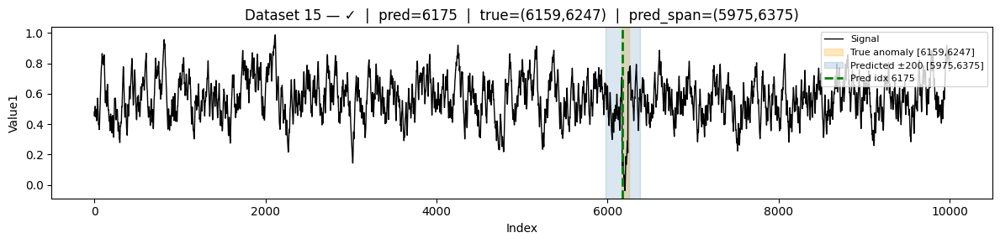

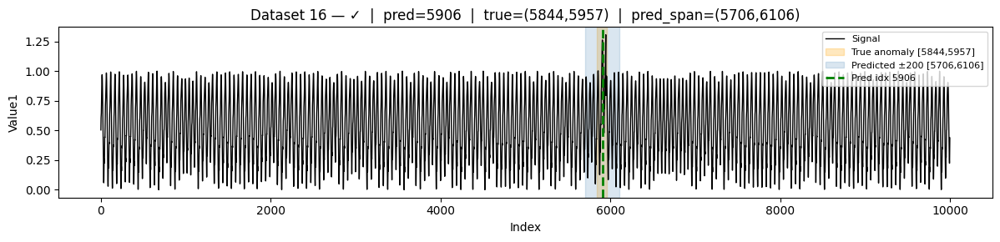

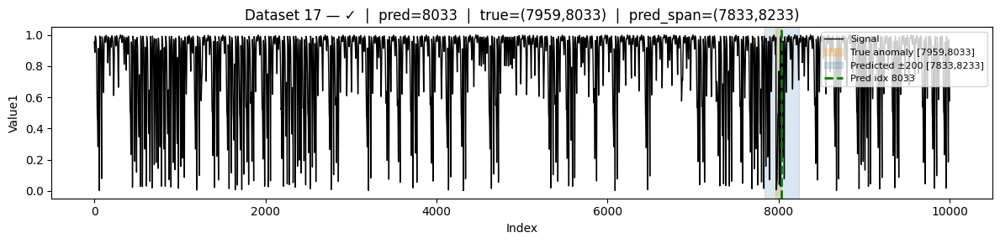

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-640.885088312222933 > -640.901466829753758). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-640.894594290140503 > -640.901466829753758). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-640.761873216466370 > -640.775652117560867). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

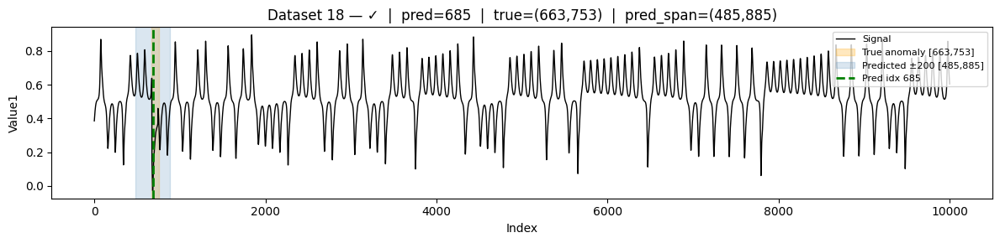

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-423.375111860134666 > -423.390872564864026). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-434.262994361262201 > -434.271044222720718). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-434.121738790589859 > -434.126208776587703). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

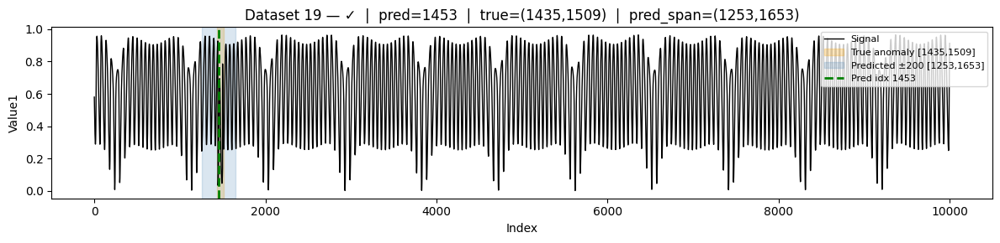

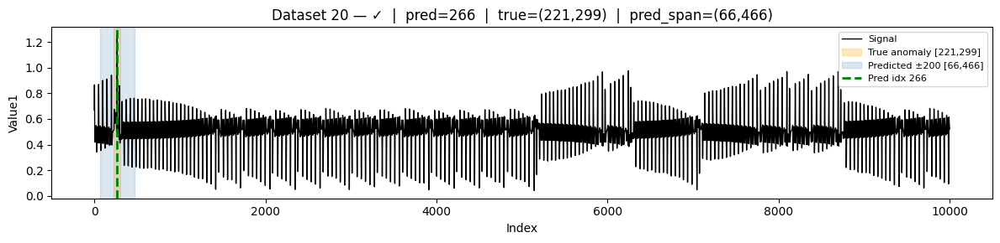

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-570.303765351015500 > -570.339860271233988). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-570.320432496472790 > -570.432864338124773). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-570.509740706194975 > -570.535312391829848). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

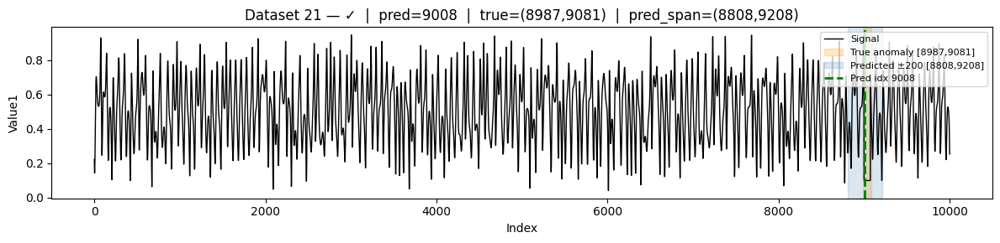

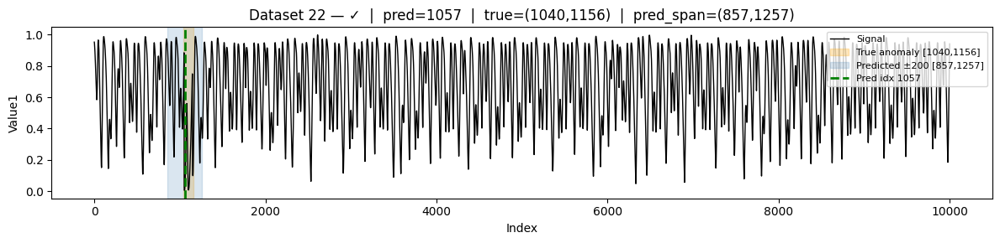

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-413.496735765870596 > -413.501479252812146). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-413.364142229314552 > -413.381922713706672). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-413.478492321877695 > -413.488402402594886). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

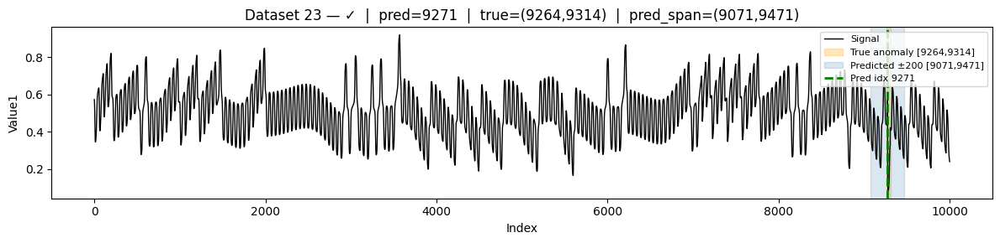

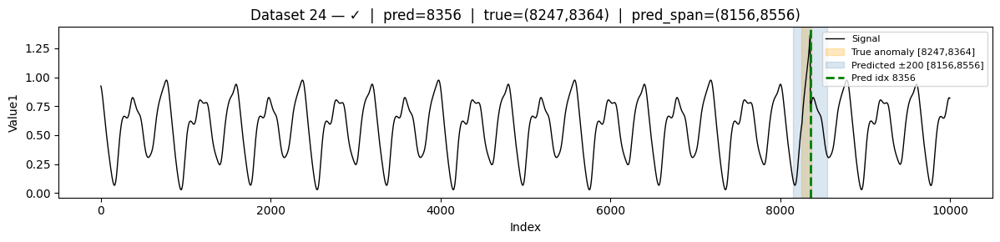

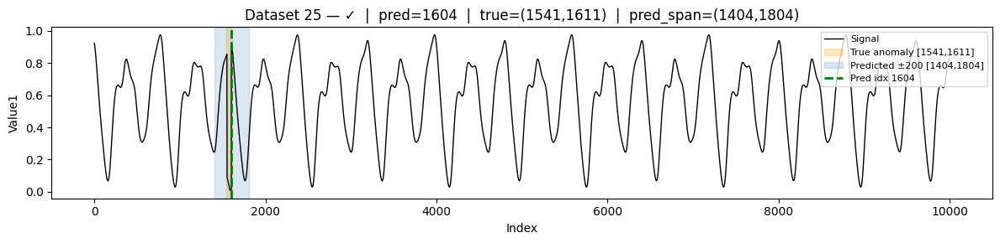

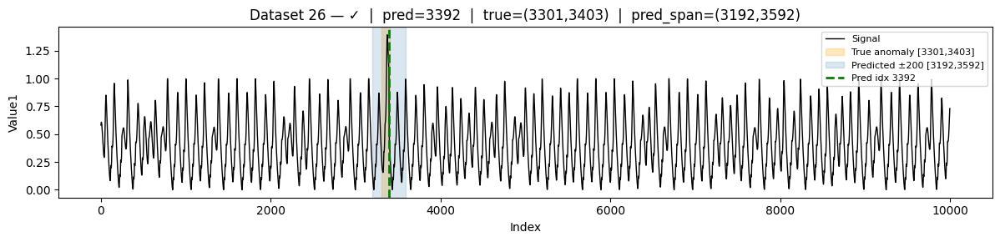

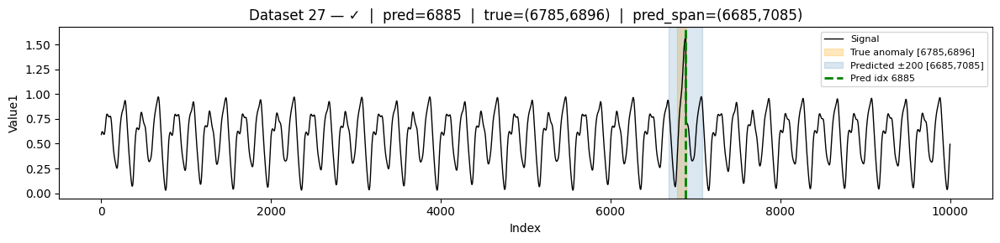

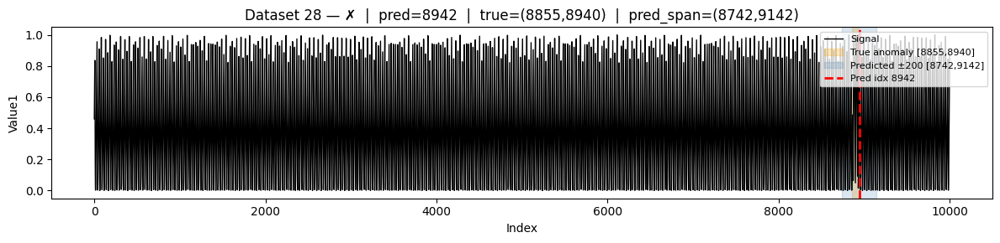

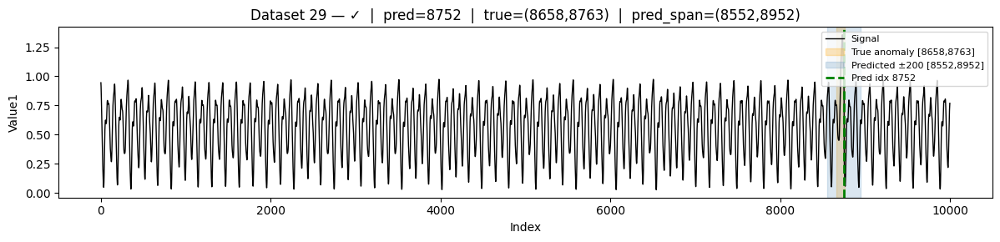

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-616.862210553137629 > -616.984660175799718). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-616.981309294927996 > -617.010429464996378). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-616.696640136724227 > -616.744227609368181). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

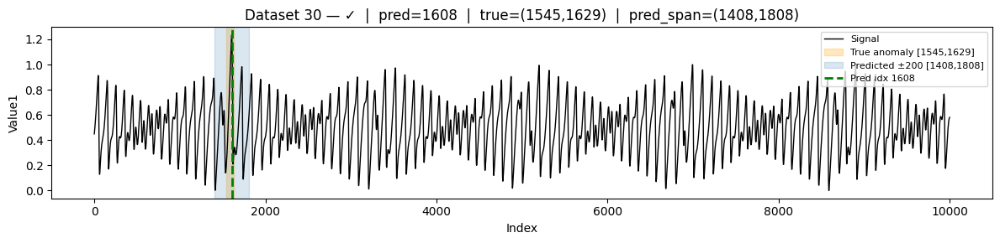

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-619.521578938006996 > -619.537540112638567). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-621.334197760045868 > -621.352731395941646). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-619.580619527689691 > -619.596787173398639). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

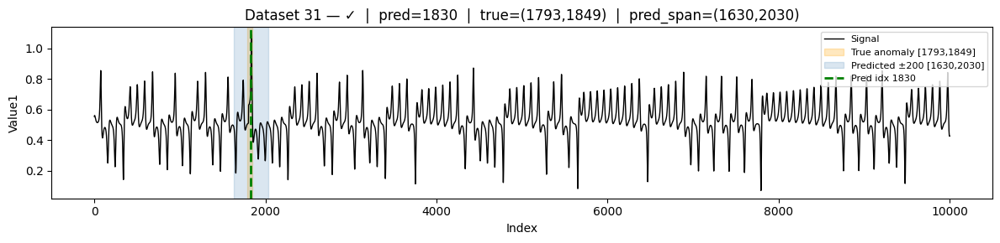

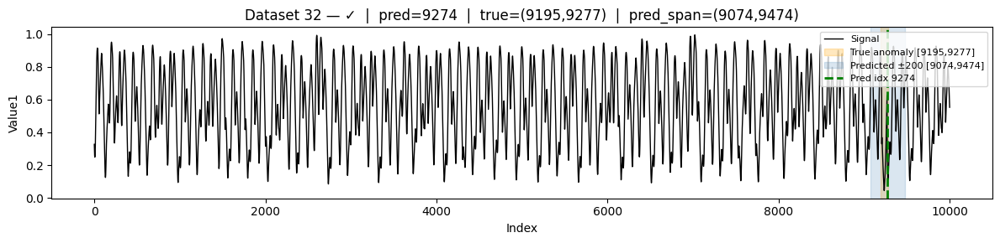

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-792.362112715001217 > -796.154051056908543). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-792.535648596345254 > -793.454985326366113). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-792.803976653403424 > -793.940628466276053). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local

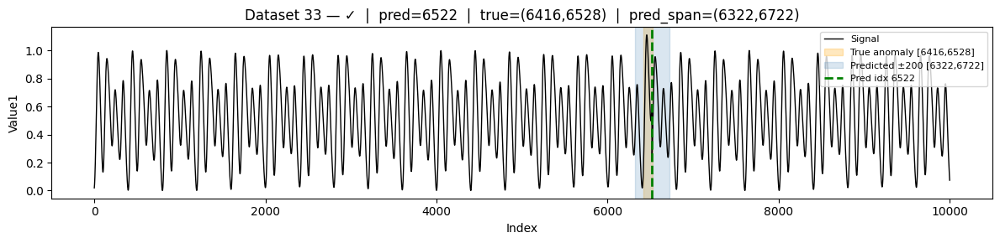

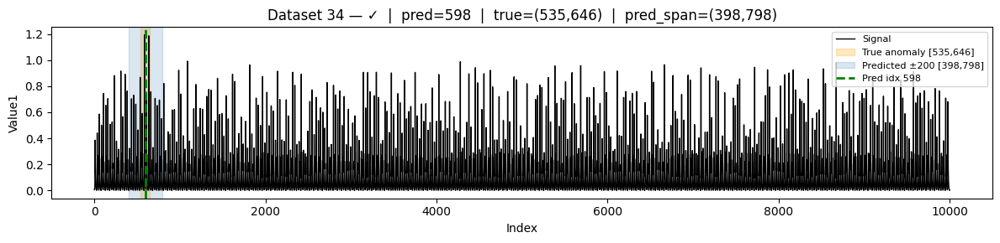

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-679.913990415325998 > -680.051161017487175). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-679.858655273052705 > -680.106092552923315). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-679.836384178469189 > -679.982175412546212). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

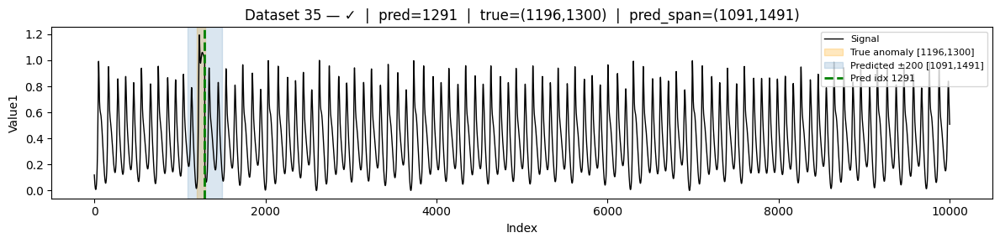

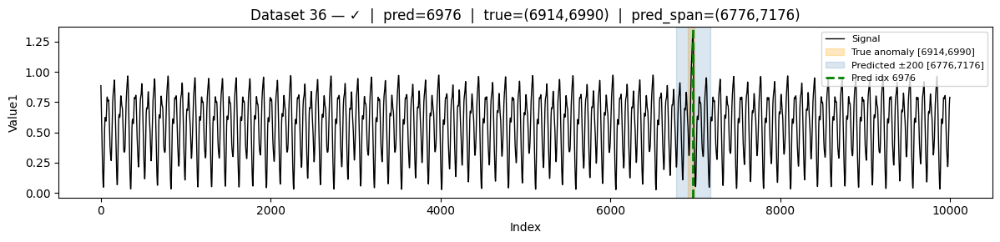

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-706.919116647119154 > -706.953811884422862). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-706.897986685701881 > -707.247250304967906). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-706.887360698335783 > -707.131707946617098). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

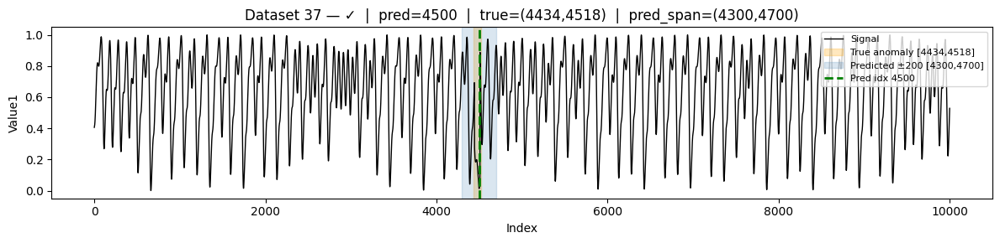

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-561.935671098436842 > -562.129578087152140). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-620.617452859674017 > -621.024648221052985). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-594.062929842114841 > -594.293645739483395). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local

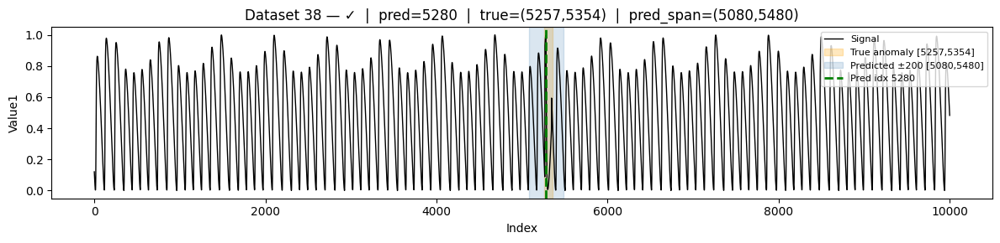

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-632.348906811475786 > -632.973270207093265). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-671.250717746092846 > -671.452372315589173). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-627.916894586815943 > -628.018886592065542). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local

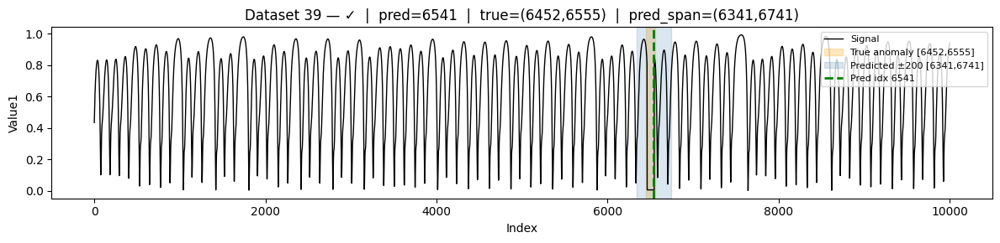

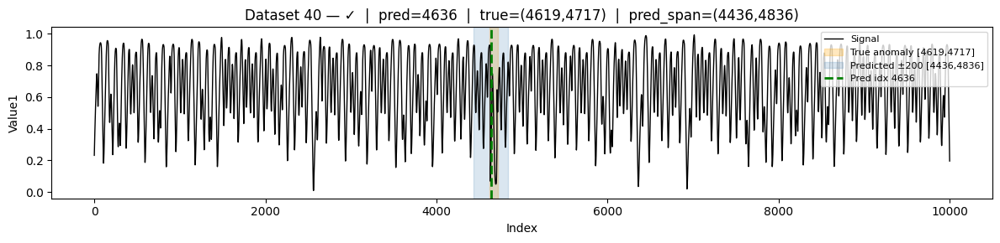

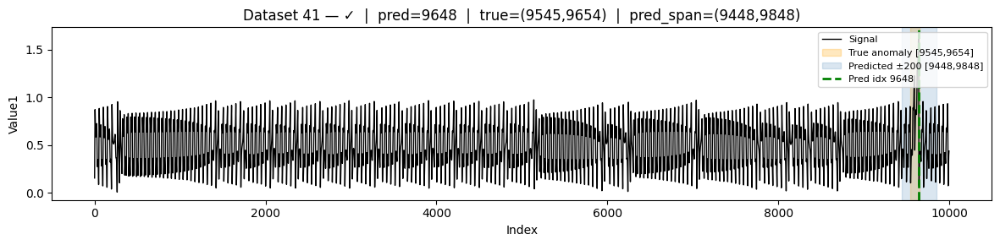

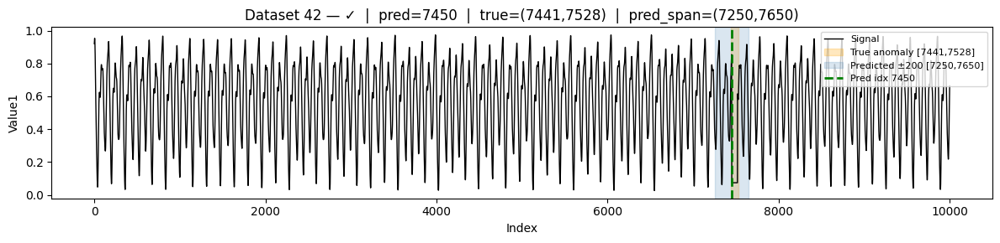

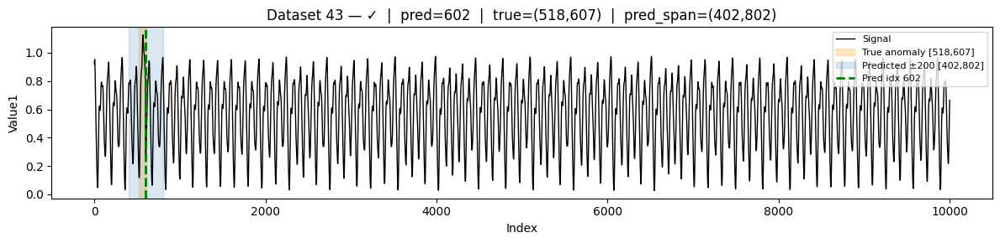

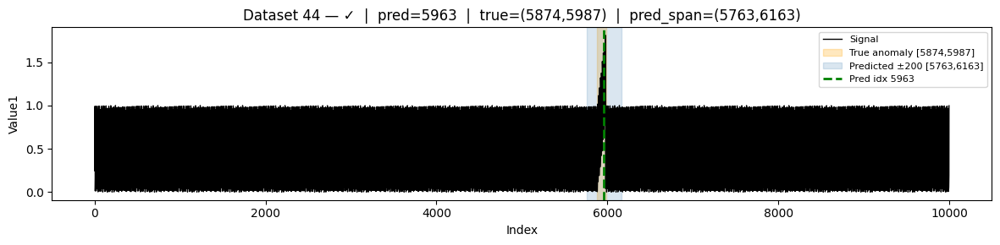

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-354.778588633895083 > -354.796994174306917). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-354.779100389690825 > -354.792724641212033). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-356.276735275479666 > -356.286805041306877). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

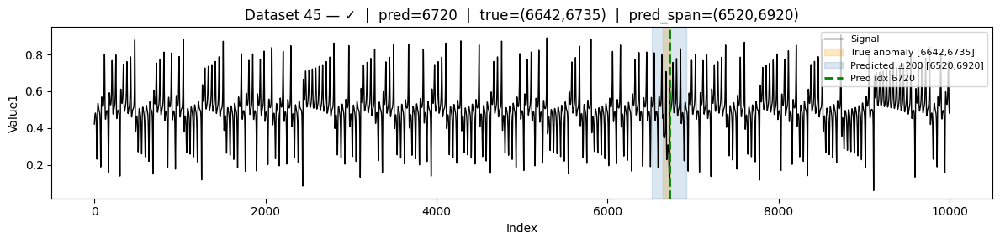

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-373.515948922843279 > -373.519936217760858). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-373.960812895608399 > -373.966664988245668). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-374.025773633968015 > -374.030386539681331). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

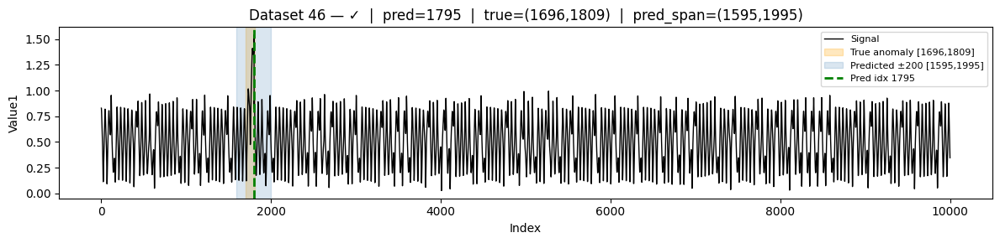

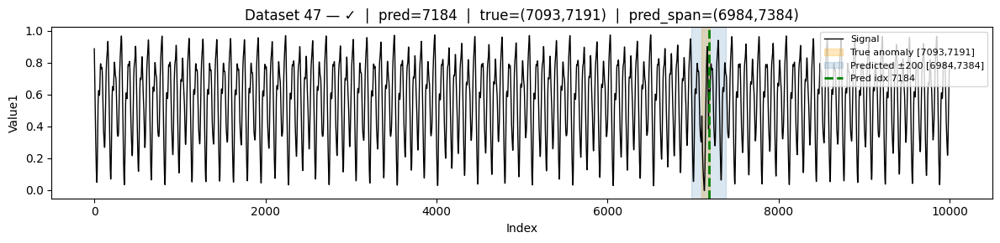

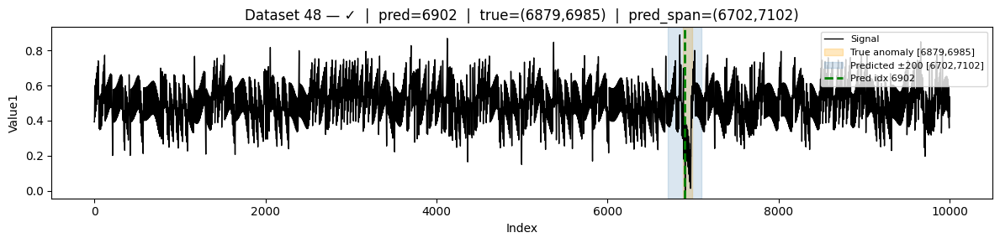

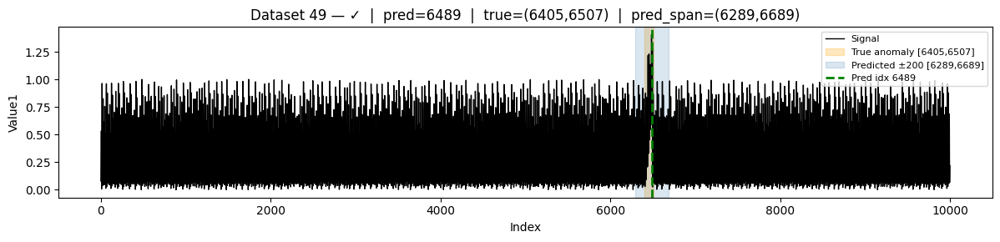

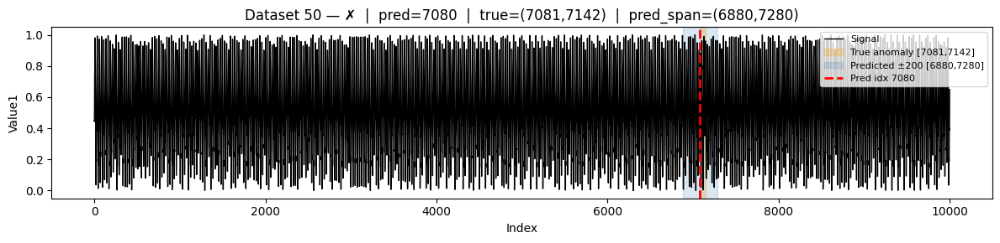

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-502.745091112545026 > -502.774276142574024). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-520.545656869880418 > -520.904496458497420). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-498.394323073493922 > -498.595529260521971). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local

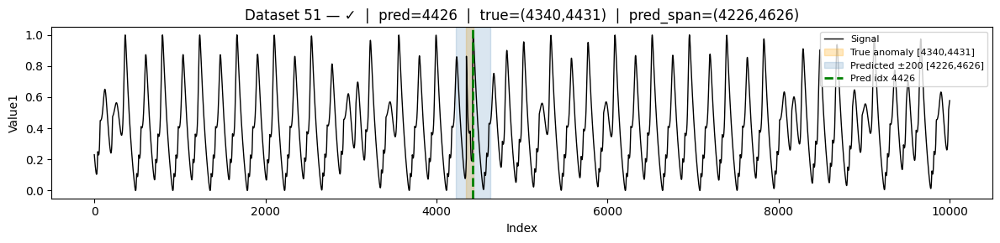

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-586.632992832613922 > -586.645533812489930). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-586.422770779928328 > -586.662751281450028). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-586.495010583842827 > -586.562783967347741). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

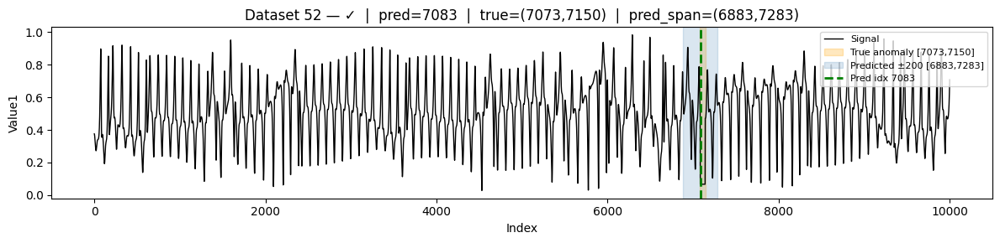

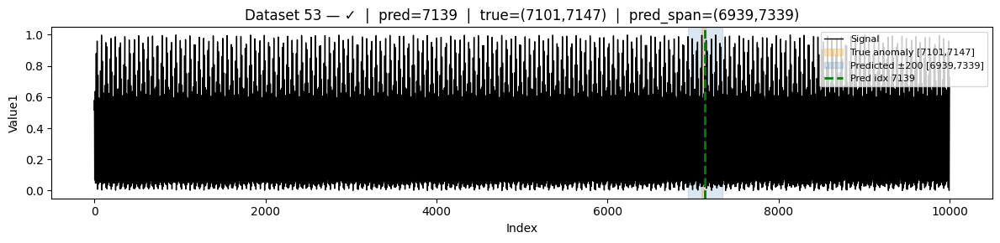

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-879.894359732900512 > -879.945627472651040). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-879.976168685594416 > -879.988092130183645). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-880.124839669246853 > -880.282187864835123). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

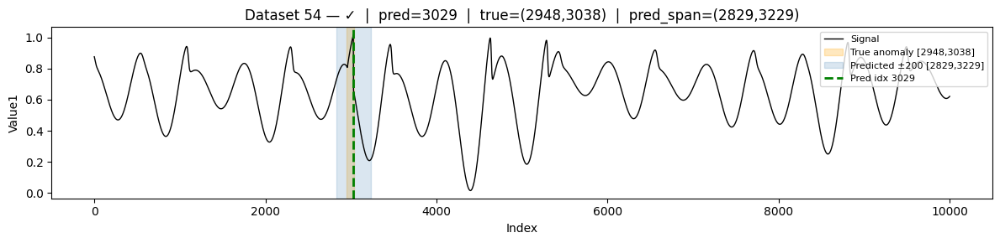

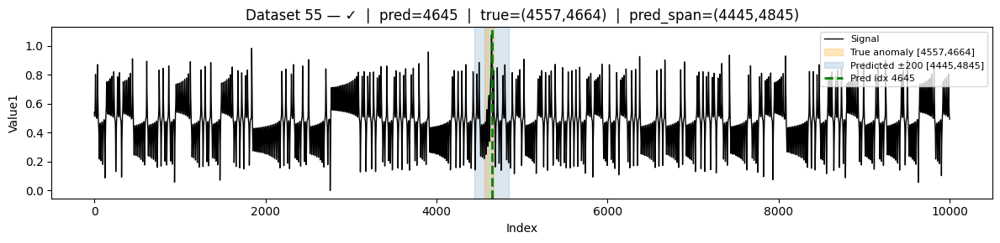

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-791.333664139380289 > -792.192941233247325). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-791.333664139380289 > -791.386752721259086). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-793.393933161101245 > -793.753847055878168). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local

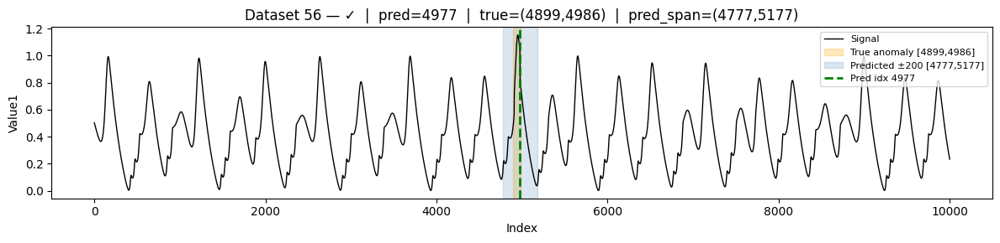

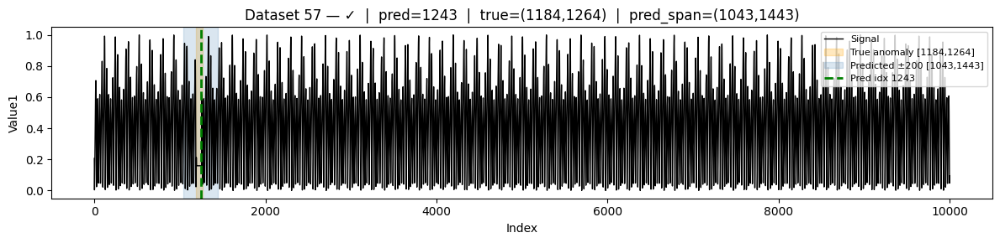

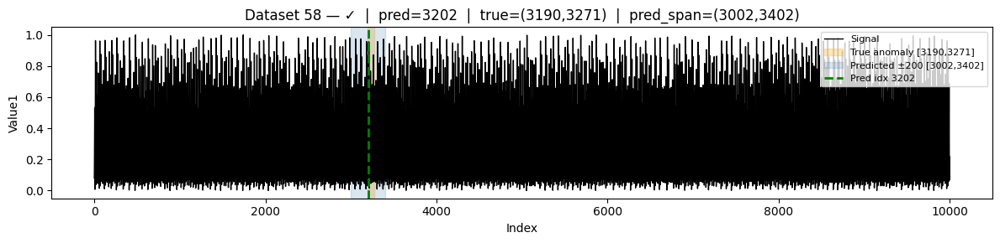

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-321.556601919730610 > -321.560641708357821). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-326.431357860165122 > -326.443651304231992). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-345.483569392831953 > -345.512867370186598). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

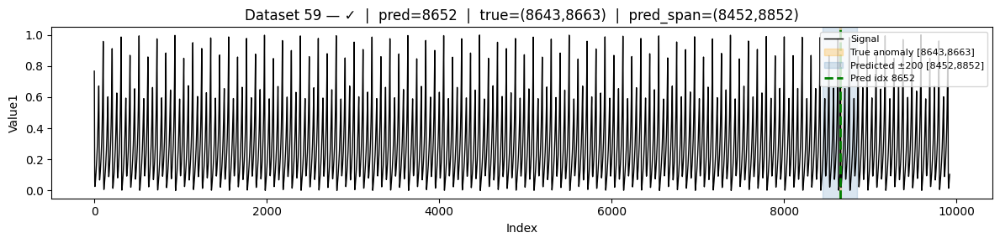

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-375.250298163850118 > -375.260778906881853). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-377.190678564331222 > -377.201188136026474). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-375.250298163850118 > -375.260778906881853). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

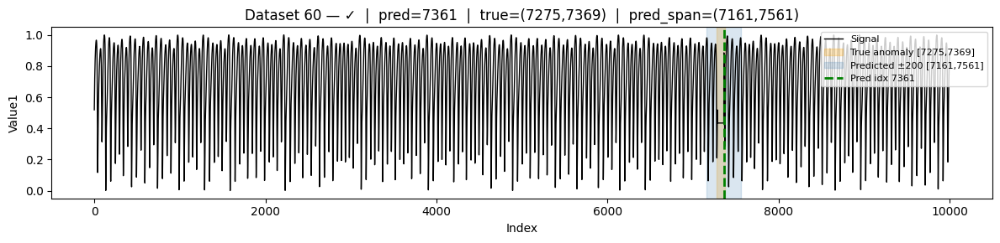

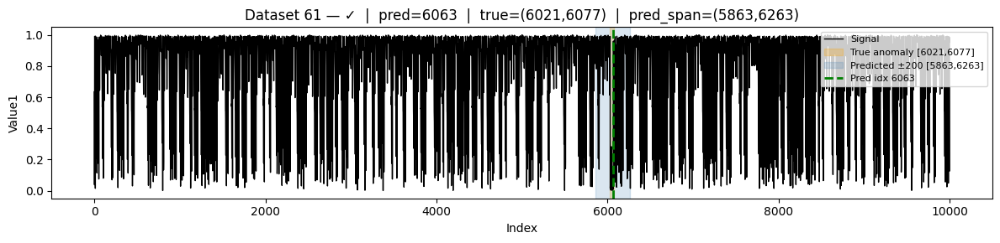

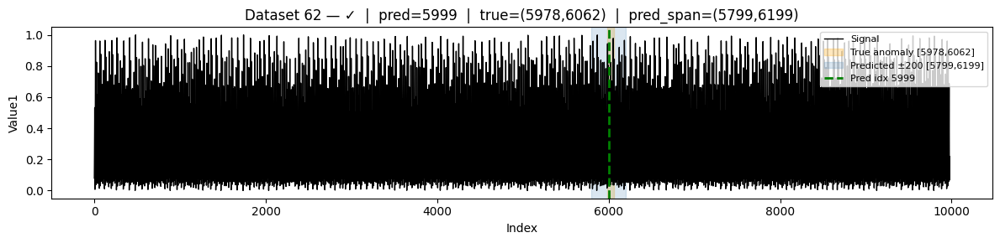

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-419.094879957680348 > -419.163903266092291). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-423.791708267599631 > -423.820295760251213). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-423.811837241613659 > -423.864258335869522). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

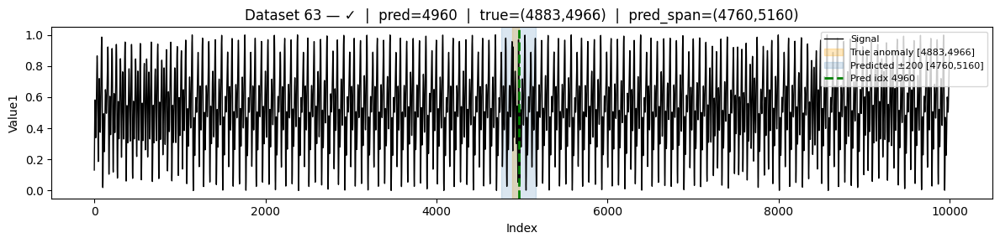

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-660.794962369065729 > -661.072883877704498). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-720.522068074222716 > -721.294188799742642). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-718.892103052754464 > -718.965828011269878). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

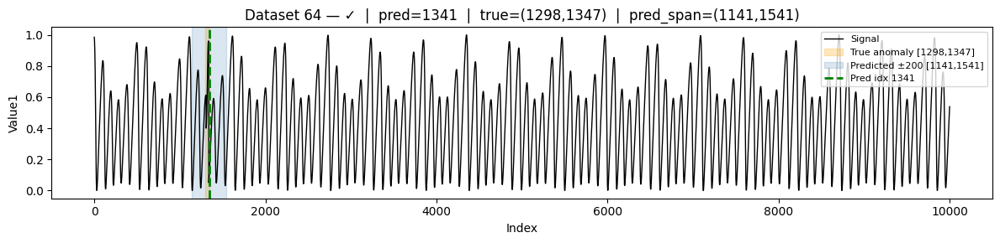

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-791.333664139380289 > -792.192941233247325). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-791.333664139380289 > -791.386752721259086). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-793.393933161101245 > -793.753847055878168). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local

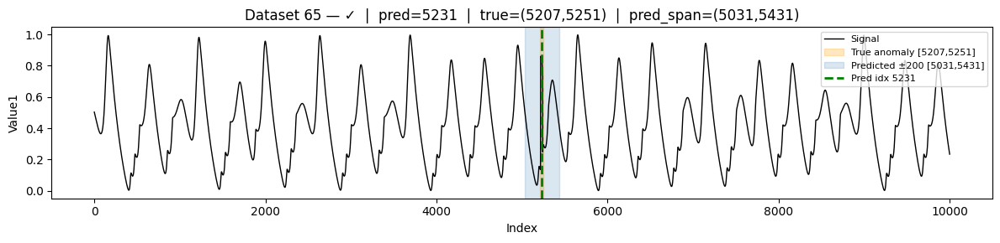

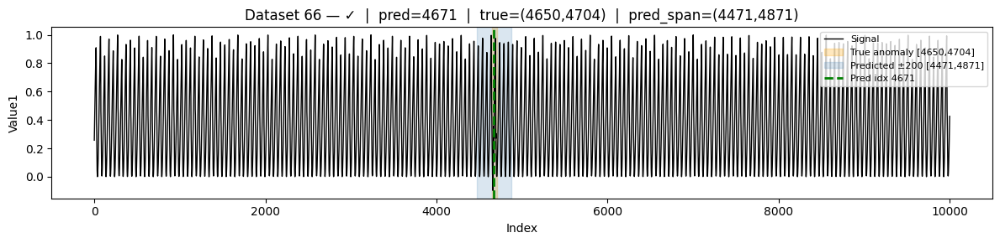

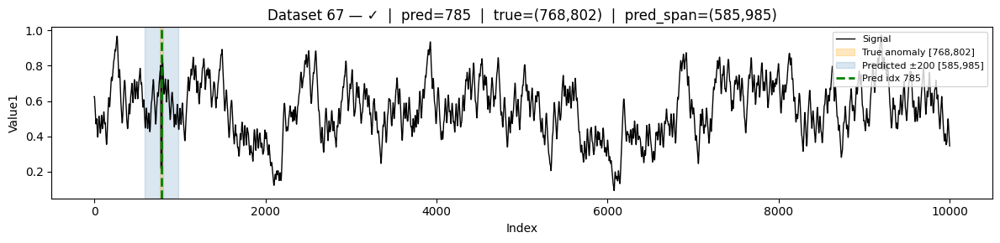

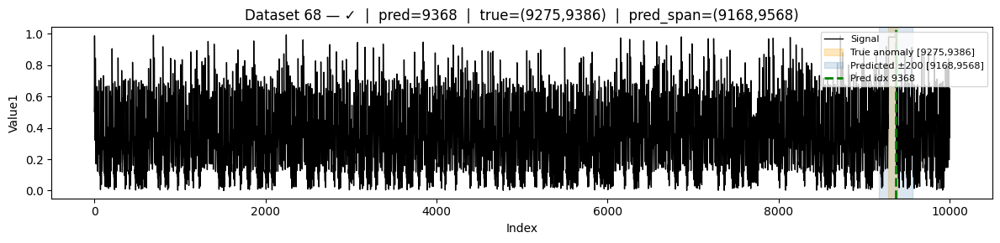

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-677.216892257253221 > -677.233256079600437). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-687.918446711267165 > -688.120337221499653). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-698.401554204662148 > -698.608383971983585). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

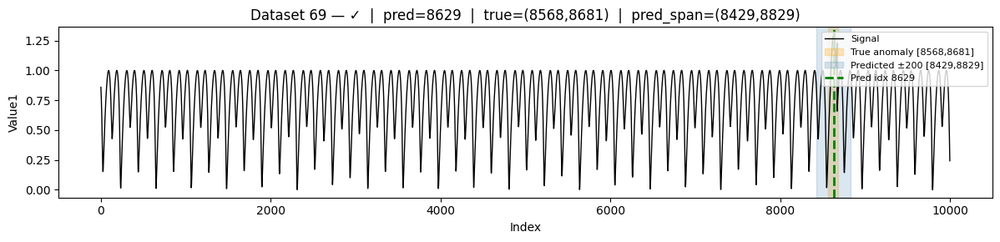

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-412.035556481702656 > -412.041406407021157). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-421.030727112852503 > -421.039025357615344). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-418.969992427821921 > -418.979018067744391). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

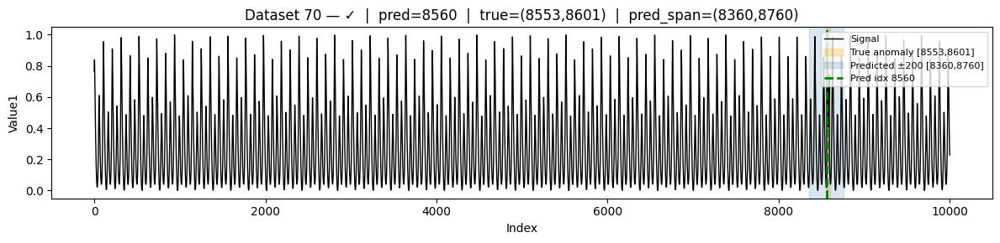

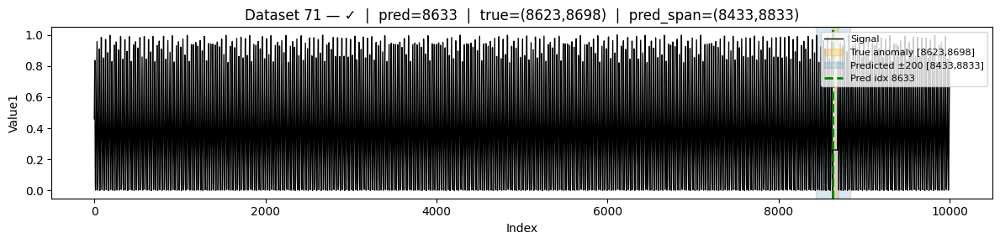

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-427.362864394952737 > -427.385934437245226). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-427.362864394952737 > -427.385934437245226). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-427.362864394952737 > -427.385934437245226). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

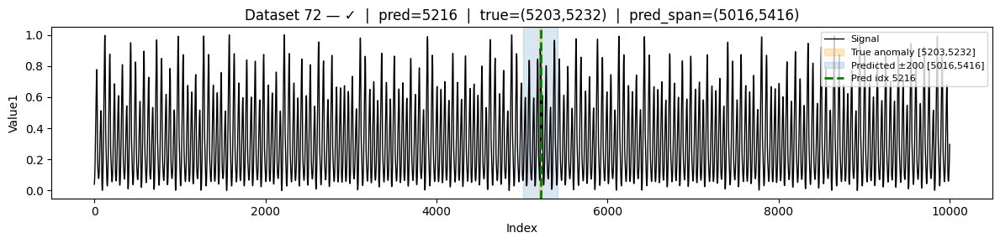

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-692.967084581187578 > -693.514758892182726). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-710.441446464197384 > -710.677048224233886). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-718.643050460440122 > -718.936530865909504). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

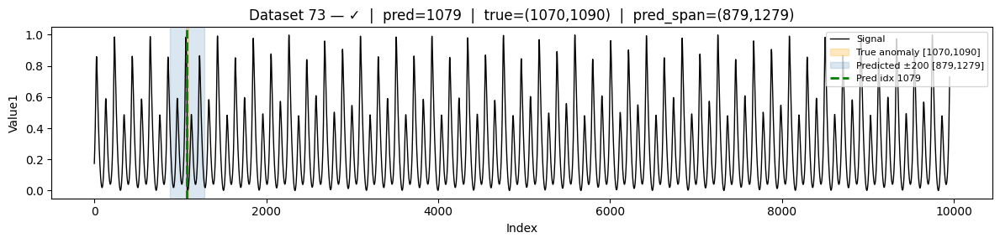

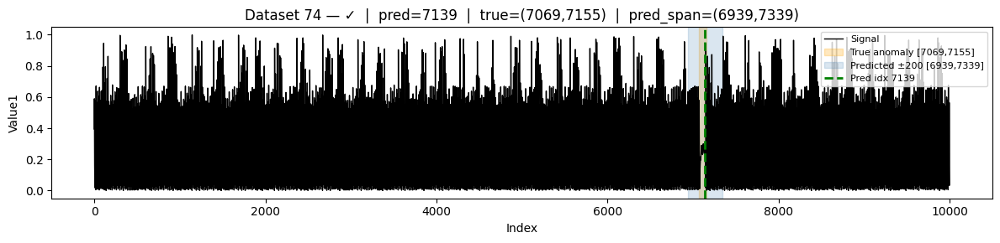

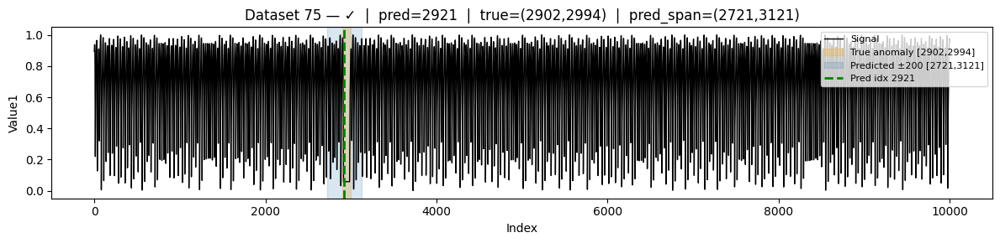

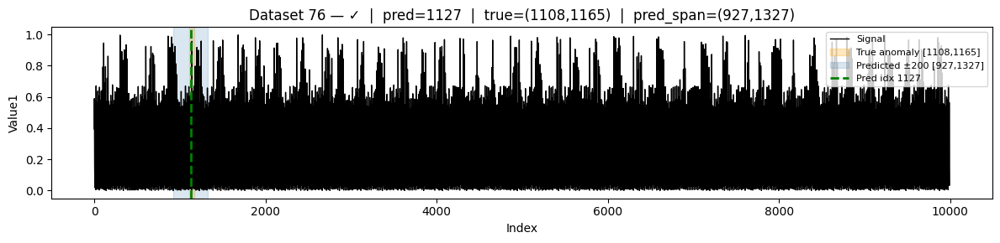

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-518.142299382003898 > -518.217917895970913). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-518.230738515888675 > -518.256040556613584). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-518.021715630010135 > -518.106239285911670). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

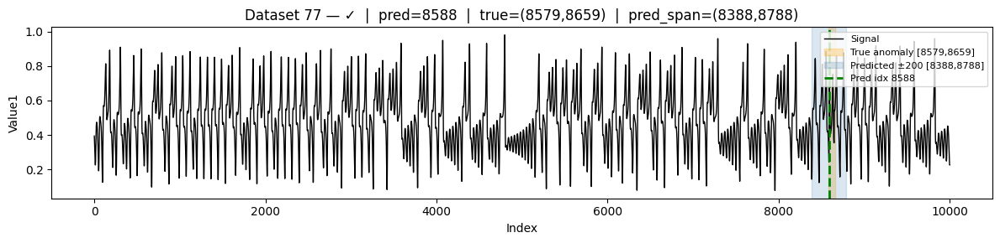

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-687.632618804816275 > -687.717027364307455). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-688.043279599311063 > -688.109687297530627). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-688.209193843387538 > -688.231975355670443). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

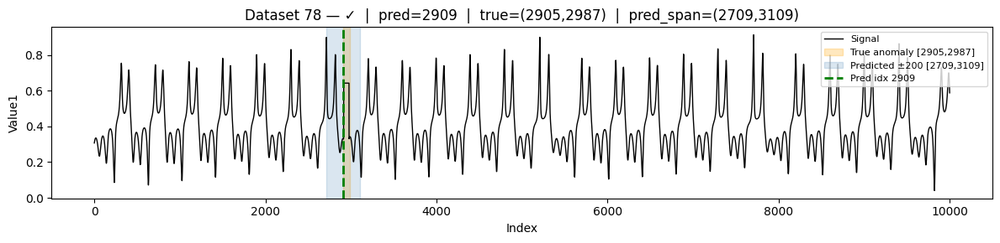

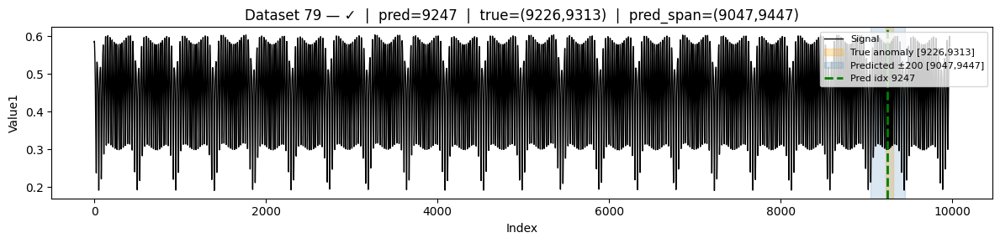

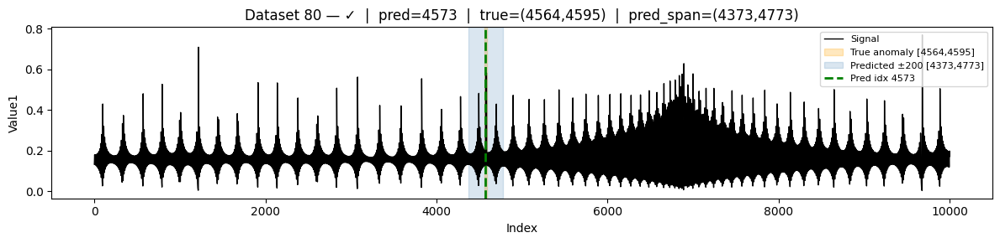

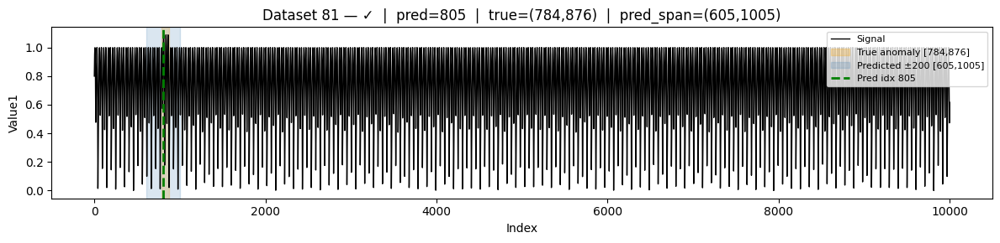

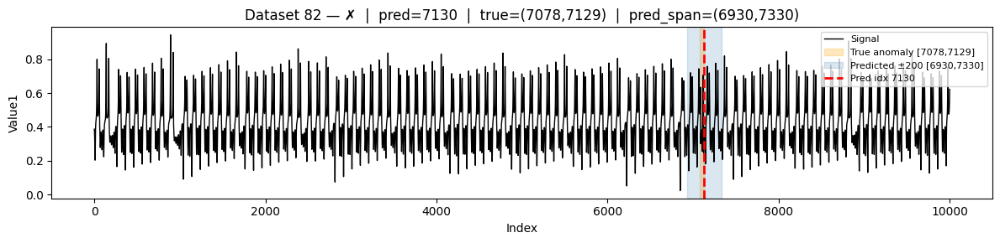

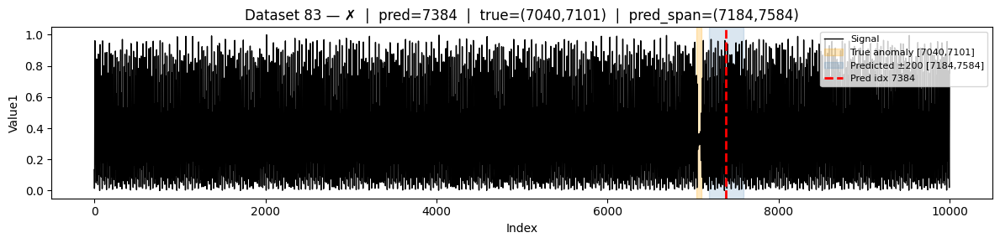

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-760.759300595457830 > -760.929704022562873). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-760.591112778983529 > -760.934682882607376). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-760.723231538403752 > -760.756193029172096). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

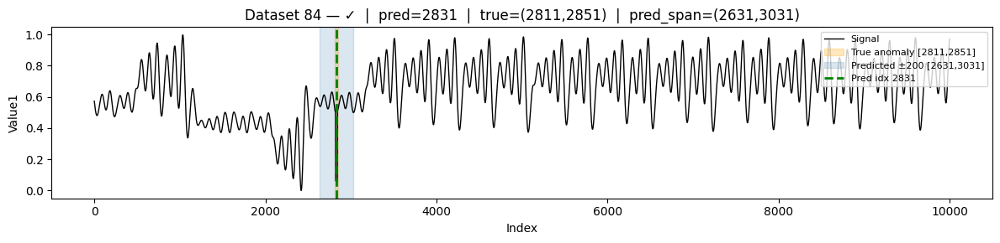

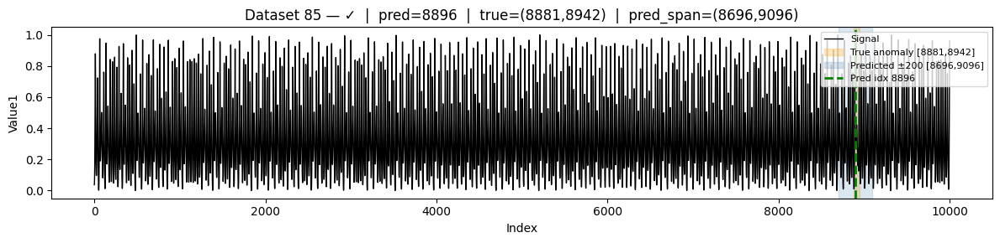

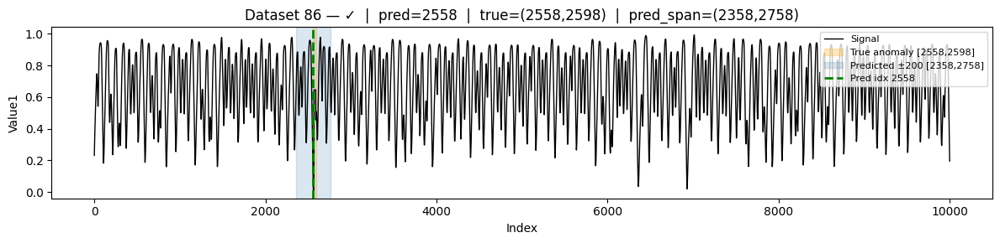

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-687.632618804816275 > -687.717027364307455). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-688.043279599311063 > -688.109687297530627). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-688.209193843387538 > -688.231975355670443). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

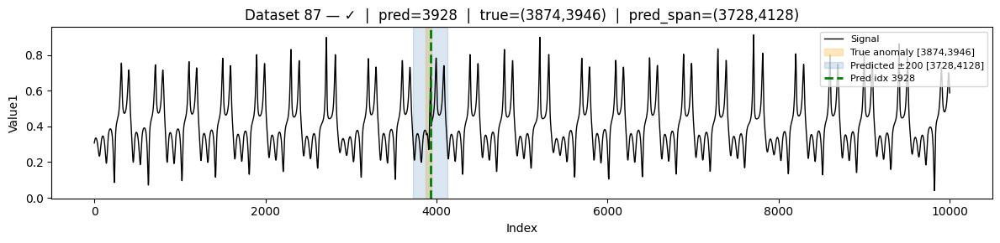

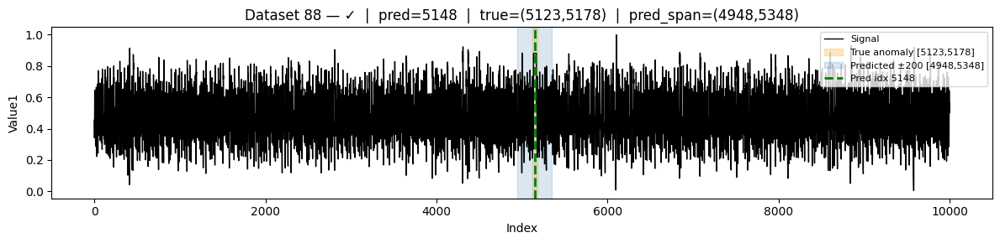

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-631.944057109017194 > -632.006840920437412). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-630.366098443332135 > -630.400695392842977). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-640.413540015855688 > -640.559868068502169). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

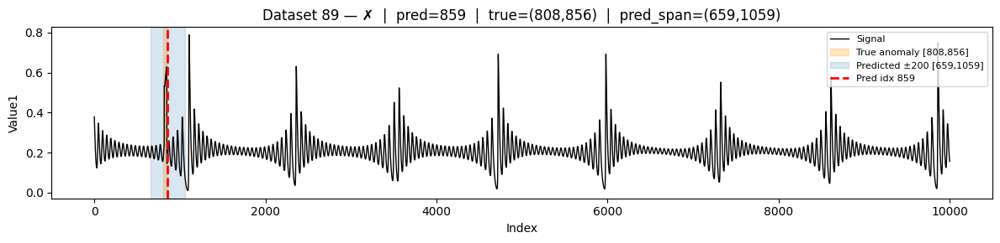

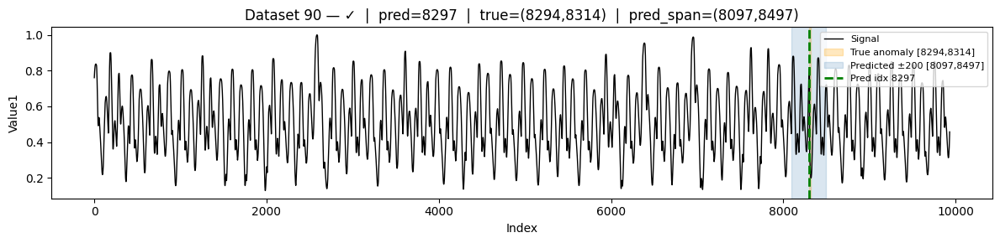

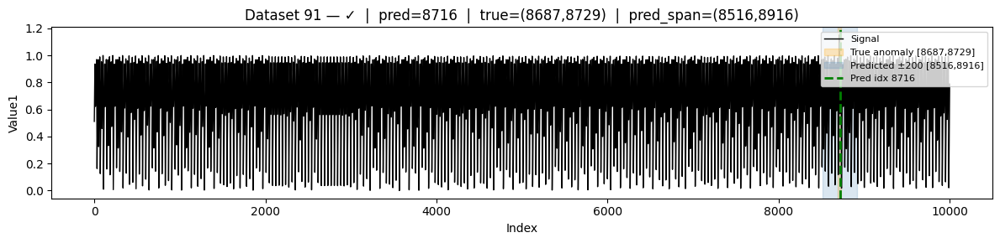

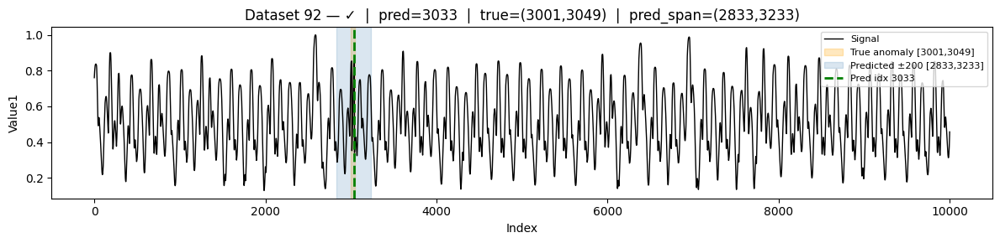

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-697.377780395135346 > -698.071108839626959). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-696.685385078733248 > -698.130263148121003). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-697.855578999653289 > -698.413348571950451). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local

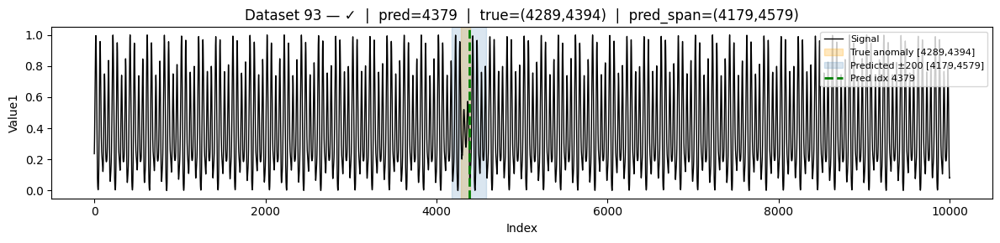

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-945.387494595411908 > -948.355927490222143). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-946.619686054274894 > -949.070975420616378). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-946.308932842333206 > -947.408441658651100). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local

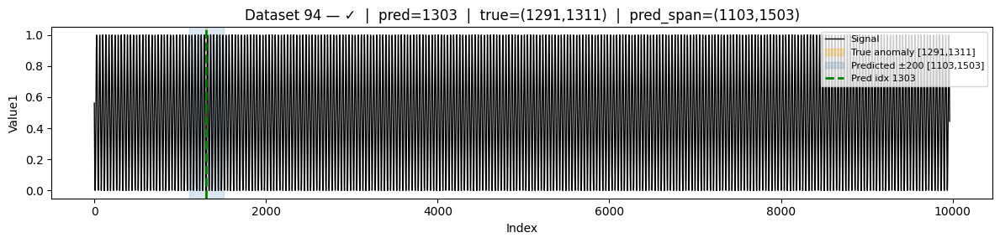

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-721.732489499646363 > -722.316548040523912). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-720.728451515128540 > -720.911936277805921). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-722.008864837642932 > -722.286153663285631). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

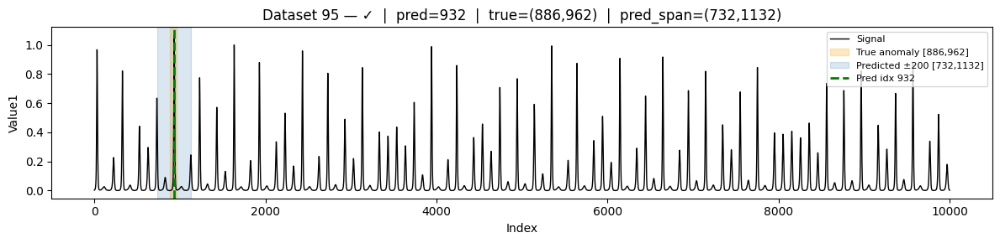

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-462.547824708972939 > -462.639809206180303). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-469.626858111182457 > -469.835644543150352). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-465.761695606858098 > -465.786120744230573). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

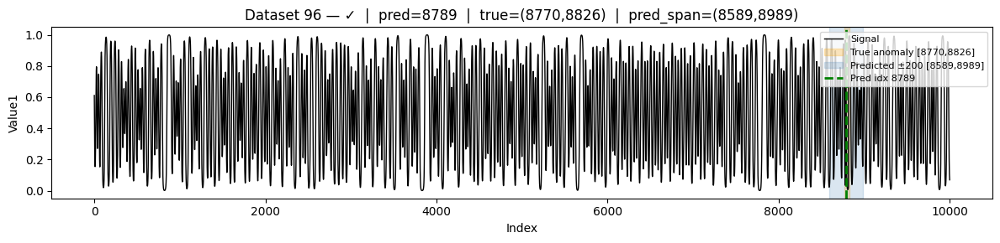

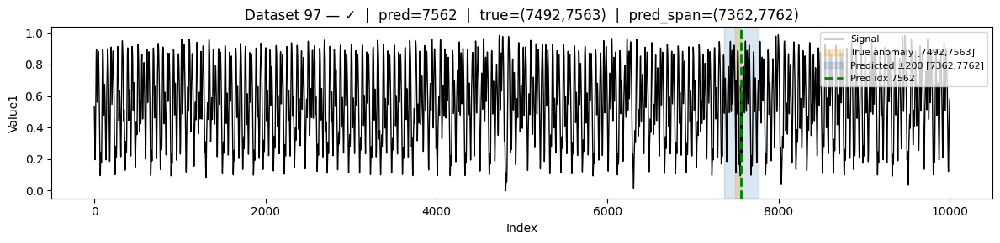

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-619.521578938006996 > -619.537540112638567). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-621.334197760045868 > -621.352731395941646). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-619.580619527689691 > -619.596787173398639). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

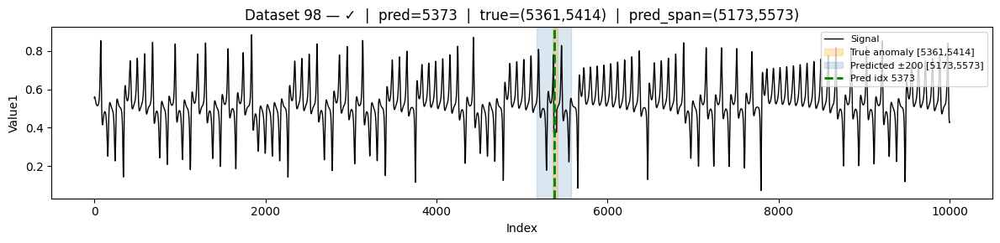

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-396.487719679495854 > -396.505625849805540). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-396.403057351034363 > -396.424758719667068). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-396.461680546723528 > -396.469981787565587). You may want to try with a higher value of support_fraction (current value: 0.750).
  warnings.warn(
/usr/local

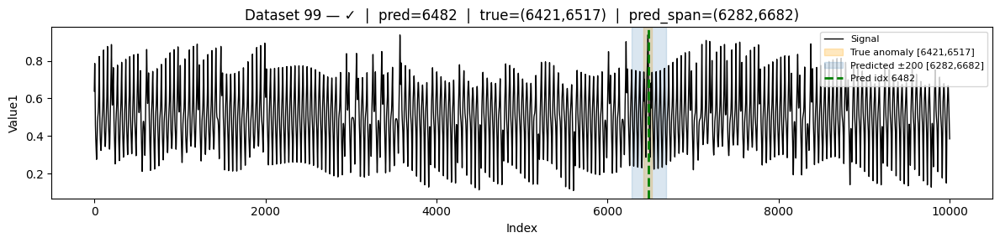

/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-947.157621199633127 > -950.154789704929158). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-946.362019289585646 > -948.407489971459768). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/covariance/_robust_covariance.py:185: RuntimeWarning: Determinant has increased; this should not happen: log(det) > log(previous_det) (-948.938591299895734 > -950.318822792150172). You may want to try with a higher value of support_fraction (current value: 0.752).
  warnings.warn(
/usr/local

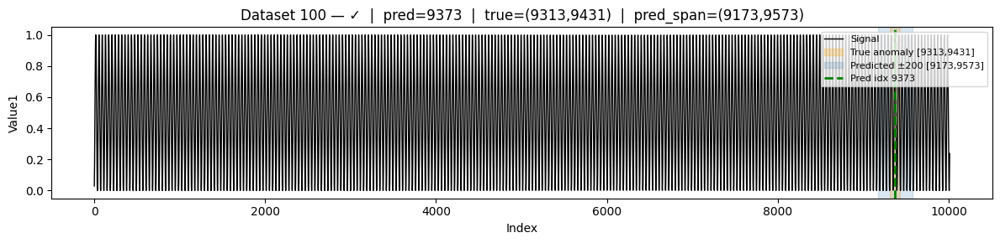

Accuracy (Cell 4 style): 95% / 100
Visuals saved to ./viz and summary to viz/summary.csv


Dataset,Correct?,IoU,True span,Pred span,Pred idx,Plot
1,✓,0.282,"(9441,9553)","(9254,9654)",9454,open
2,✓,0.297,"(5005,5123)","(4921,5321)",5121,open
3,✓,0.219,"(982,1069)","(860,1260)",1060,open
4,✓,0.292,"(1890,2006)","(1765,2165)",1965,open
5,✓,0.277,"(4423,4533)","(4244,4644)",4444,open
6,✓,0.197,"(8664,8742)","(8522,8922)",8722,open
7,✓,0.277,"(7809,7919)","(7707,8107)",7907,open
8,✓,0.180,"(6511,6582)","(6312,6712)",6512,open
9,✓,0.192,"(6420,6496)","(6276,6676)",6476,open
10,✓,0.222,"(638,726)","(521,921)",721,open


In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, HTML

expand = 200  # model's ±range
os.makedirs("viz", exist_ok=True)

def true_span(labels: pd.Series):
    ones = np.where(labels.to_numpy().astype(int) == 1)[0]
    if ones.size == 0:
        return None, None
    return int(ones.min()), int(ones.max())

def pred_span(pred_idx: int, n: int, k: int):
    if pred_idx is None or pred_idx < 0 or pred_idx >= n:
        return None, None
    return max(0, pred_idx - k), min(n - 1, pred_idx + k)

def plot_one(test_df: pd.DataFrame, pred_idx: int, ds_id: int):
    n = len(test_df)
    x = np.arange(n)
    y = test_df["Value1"].to_numpy().astype(float)

    t0, t1 = true_span(test_df["Labels"])
    p0, p1 = pred_span(pred_idx, n, expand)
    correct = (t0 is not None and t1 is not None and t0 <= pred_idx <= t1)

    plt.figure(figsize=(12, 3))
    plt.plot(x, y, lw=1, color="black", label="Signal")

    if t0 is not None and t1 is not None:
        plt.axvspan(t0, t1, color="orange", alpha=0.25, label=f"True anomaly [{t0},{t1}]")
    if p0 is not None and p1 is not None:
        plt.axvspan(p0, p1, color="steelblue", alpha=0.2, label=f"Predicted ±{expand} [{p0},{p1}]")
    if 0 <= pred_idx < n:
        plt.axvline(pred_idx, color=("green" if correct else "red"), lw=2, linestyle="--",
                    label=f"Pred idx {pred_idx}")

    title = f"Dataset {ds_id} — {'✓' if correct else '✗'}  |  pred={pred_idx}  |  true=({t0},{t1})  |  pred_span=({p0},{p1})"
    plt.title(title)
    plt.xlabel("Index")
    plt.ylabel("Value1")
    plt.legend(loc="upper right", fontsize=8)
    plt.tight_layout()
    outpath = f"viz/test_{ds_id:03d}.png"
    plt.savefig(outpath, dpi=150)
    plt.show()
    plt.close()

    if t0 is None or t1 is None or p0 is None or p1 is None:
        overlap = False
        iou = 0.0
    else:
        inter = max(0, min(t1, p1) - max(t0, p0) + 1)
        len_t = t1 - t0 + 1
        len_p = p1 - p0 + 1
        union = len_t + len_p - inter
        iou = inter / union if union > 0 else 0
        overlap = inter > 0
    return {
        "dataset": ds_id,
        "pred_idx": pred_idx,
        "true_start": t0, "true_end": t1,
        "pred_start": p0, "pred_end": p1,
        "inside_true": bool(correct),
        "overlap": bool(overlap),
        "iou": float(iou),
        "png": outpath
    }


results = []
for i, (train, test) in enumerate(zip(train_files, test_files), start=1):
    model = AnomalyDetectionModel()  # from Cell 3
    model.fit(train.Value1.to_numpy().flatten(), train.Labels.to_numpy().flatten())
    pred_idx = int(model.predict(test.Value1.to_numpy().flatten()))
    results.append(plot_one(test, pred_idx, i))

summary = pd.DataFrame(results)
summary.to_csv("viz/summary.csv", index=False)
acc = int(summary["inside_true"].sum())
total = len(summary)
print(f"Accuracy (Cell 4 style): {acc}% / {total}")
print("Visuals saved to ./viz and summary to viz/summary.csv")


def yesno(b): return "✓" if b else "✗"
display(HTML("""
<h3>Model vs. True anomaly (±50)</h3>
<p>Orange = true anomaly, Blue = model ±50 range, Dashed line = predicted index</p>
<table border='1' cellspacing='0' cellpadding='4'>
<tr><th>Dataset</th><th>Correct?</th><th>IoU</th><th>True span</th><th>Pred span</th><th>Pred idx</th><th>Plot</th></tr>
%s
</table>
""" % "\n".join(
    f"<tr><td>{int(r.dataset)}</td>"
    f"<td>{yesno(r.inside_true)}</td>"
    f"<td>{r.iou:.3f}</td>"
    f"<td>({r.true_start},{r.true_end})</td>"
    f"<td>({r.pred_start},{r.pred_end})</td>"
    f"<td>{int(r.pred_idx)}</td>"
    f"<td><a href='{r.png}' target='_blank'>open</a></td></tr>"
    for _, r in summary.iterrows()
)))